In [3]:
%cd ".."

/home/id1896/python/2A/projet-statistique-2022


In [4]:
from gensim import models
from sklearn.manifold import TSNE, MDS
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import time

from sklearn import decomposition
from sklearn import preprocessing
from sklearn.metrics.pairwise import euclidean_distances, manhattan_distances
from skbio.stats import distance
import scipy.spatial as sp
import scipy.stats
import random

from word_embedding.distance_wmd import *
import mantel_test.correlation as mantel_parallel

In [5]:
#Read WMD matrix 
mat_distance_wmd = lecture_fichier_distances_wmd("distances_cbow.7z")
mat_distance_wmd.head()

,0,1,2,3,4,5,6,7,8,9,...,9491,9492,9493,9494,9495,9496,9497,9498,9499,9500
0,0,307,293,386,327,413,329,309,242,632,...,690,370,782,400,277,294,303,327,394,283
1,307,0,81,230,222,370,308,262,131,737,...,735,351,856,419,134,148,160,242,281,115
2,293,81,0,232,229,363,298,239,121,739,...,722,342,853,401,122,145,144,242,260,115
3,386,230,232,0,184,447,350,314,241,758,...,715,451,749,454,188,190,220,176,384,221
4,327,222,229,184,0,397,333,272,218,662,...,680,377,758,390,179,185,221,162,340,194


# Embedding

In [6]:
sample_size = 300
sample_index = random.sample(range(mat_distance_wmd.shape[0]),sample_size)
mat_distance_wmd_sample = np.copy(mat_distance_wmd.values)
mat_distance_wmd_sample = mat_distance_wmd_sample[np.ix_(sample_index,sample_index)]
mat_distance_wmd_sample

array([[  0, 204, 311, ..., 269, 312, 117],
       [204,   0, 309, ..., 291, 358, 223],
       [311, 309,   0, ..., 319, 439, 321],
       ...,
       [269, 291, 319, ...,   0, 459, 279],
       [312, 358, 439, ..., 459,   0, 373],
       [117, 223, 321, ..., 279, 373,   0]], dtype=uint32)

## On considere mat_distance_wmd comme le doc embedding et on calcule la matrice de distance euclidiennes

In [7]:
#On considere mat_distance_wmd comme le doc embedding et on calcule la matrice de distance euclidiennes
mat_distance_euclidean = euclidean_distances(mat_distance_wmd_sample)

## Faire une ACP en ne considérant pas la matrice de variance mais en passant par la matrice de distance wmd (faire une transformation pour avoir une matrice de similarite)

In [8]:
mat_distance_square = mat_distance_wmd_sample ** 2
mat_centre = np.identity(mat_distance_square.shape[0]) - np.ones(mat_distance_square.shape)/mat_distance_square.shape[0]
mat_acp = -np.matmul(np.matmul(mat_centre,mat_distance_square),mat_centre)/2

In [9]:
vals_prop, vecs_prop = np.linalg.eig(mat_acp)

<AxesSubplot:>

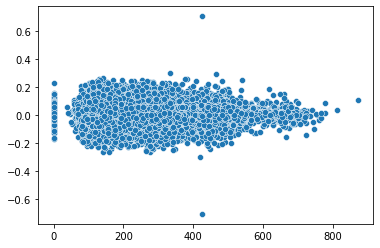

In [14]:
acp_distance = euclidean_distances(np.transpose(vecs_prop))
nb_prop = vecs_prop.shape[0]
wmd_triu = mat_distance_wmd_sample[np.triu_indices(nb_prop)]
acp_triu = vecs_prop[np.triu_indices(nb_prop)]

sns.scatterplot(x=wmd_triu,y=acp_triu)

## MDS

In [34]:
mds_model = MDS(n_components=2, dissimilarity="precomputed")
mds_embedding = mds_model.fit_transform(mat_distance_wmd_sample)

/home/id1896/.local/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:>

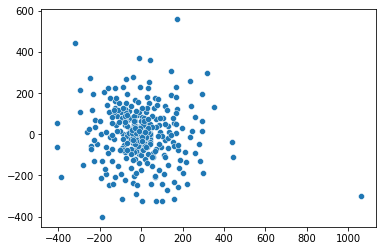

In [39]:
sns.scatterplot(mds_embedding[:,1],mds_embedding[:,0])

In [56]:
mds_distance = np.round(euclidean_distances(mds_embedding))

<AxesSubplot:>

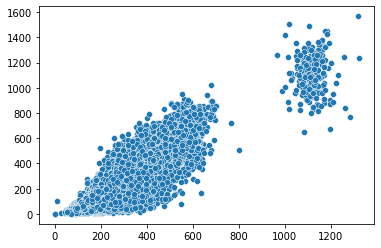

In [53]:
nb_prop = mds_distance.shape[0]
wmd_triu = mat_distance_wmd_sample[np.triu_indices(nb_prop)]
mds_triu = mds_distance[np.triu_indices(nb_prop)]

sns.scatterplot(x=wmd_triu,y=mds_triu)

In [55]:
mantel_parallel.test(mat_distance_wmd_sample,
                     mds_distance,
                     method="spearman",
                     perms=400,
                     parallel=True,
                     n_jobs=5)

(0.8653656255008467, 0.0025, 15.76067018530799)

## Autres approches

# Mantel test

## Nombre de permutation

In [17]:
list_nb_permu = [i for i in range(40,1000,20)]
list_time_mantel_test = []
list_resu_mantel_test = []
for nb_perm in list_nb_permu:
    print(f"Nombre de permuatation: {nb_perm} ",end=" ")
    t = time.time()
    resu = mantel_parallel.test(mat_distance_wmd,
                            mat_distance_euclidean,
                            method="spearman",
                            perms=nb_perm,
                            parallel=True,
                            n_jobs=5)
    list_time_mantel_test.append(time.time()-t)
    list_resu_mantel_test.append(resu)

Nombre de permuatation: 40  Nombre de permuatation: 60  Nombre de permuatation: 80  Nombre de permuatation: 100  Nombre de permuatation: 120  Nombre de permuatation: 140  Nombre de permuatation: 160  Nombre de permuatation: 180  Nombre de permuatation: 200  Nombre de permuatation: 220  Nombre de permuatation: 240  Nombre de permuatation: 260  Nombre de permuatation: 280  Nombre de permuatation: 300  Nombre de permuatation: 320  Nombre de permuatation: 340  Nombre de permuatation: 360  Nombre de permuatation: 380  Nombre de permuatation: 400  Nombre de permuatation: 420  Nombre de permuatation: 440  Nombre de permuatation: 460  Nombre de permuatation: 480  Nombre de permuatation: 500  Nombre de permuatation: 520  Nombre de permuatation: 540  Nombre de permuatation: 560  Nombre de permuatation: 580  Nombre de permuatation: 600  Nombre de permuatation: 620  Nombre de permuatation: 640  Nombre de permuatation: 660  Nombre de permuatation: 680  Nombre de permuatation: 700  Nombre de permuat

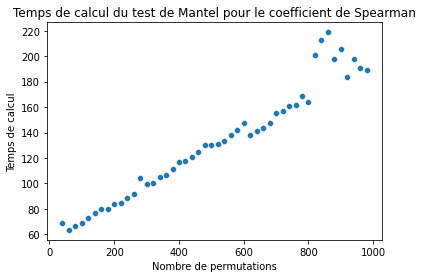

In [20]:
sns.scatterplot(x=list_nb_permu,y=list_time_mantel_test)
plt.xlabel("Nombre de permutations")
plt.ylabel("Temps de calcul")
plt.title("Temps de calcul du test de Mantel pour le coefficient de Spearman")
plt.show()

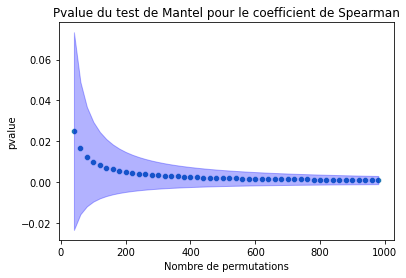

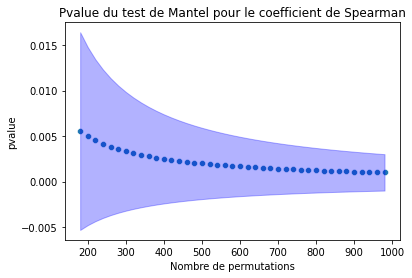

In [21]:
low_ic = [list_resu_mantel_test[i][1] - 1.96*np.sqrt(list_resu_mantel_test[i][1]*(1-list_resu_mantel_test[i][1])/list_nb_permu[i]) for i in range(len(list_resu_mantel_test))]
up_ic = [list_resu_mantel_test[i][1] + 1.96*np.sqrt(list_resu_mantel_test[i][1]*(1-list_resu_mantel_test[i][1])/list_nb_permu[i]) for i in range(len(list_resu_mantel_test))]
sns.scatterplot(x=list_nb_permu, y=[resu_mantel_test[1] for resu_mantel_test in list_resu_mantel_test])
plt.fill_between(list_nb_permu, low_ic, up_ic, alpha=0.3, color='blue')
plt.xlabel("Nombre de permutations")
plt.ylabel("pvalue")
plt.title("Pvalue du test de Mantel pour le coefficient de Spearman")
plt.show()

debut = 7
low_ic = [list_resu_mantel_test[i][1] - 1.96*np.sqrt(list_resu_mantel_test[i][1]*(1-list_resu_mantel_test[i][1])/list_nb_permu[i]) for i in range(debut,len(list_resu_mantel_test))]
up_ic = [list_resu_mantel_test[i][1] + 1.96*np.sqrt(list_resu_mantel_test[i][1]*(1-list_resu_mantel_test[i][1])/list_nb_permu[i]) for i in range(debut,len(list_resu_mantel_test))]
sns.scatterplot(x=list_nb_permu[debut:], y=[resu_mantel_test[1] for resu_mantel_test in list_resu_mantel_test[debut:]])
plt.fill_between(list_nb_permu[debut:], low_ic, up_ic, alpha=0.3, color='blue')
plt.xlabel("Nombre de permutations")
plt.ylabel("pvalue")
plt.title("Pvalue du test de Mantel pour le coefficient de Spearman")
plt.show()